# Data Visualization

In [2]:
import numpy as np
import pickle
import seaborn as sns
import pandas as pd
import matplotlib
#matplotlib.use('Agg')
import matplotlib.pyplot as plt

In [3]:
# Load the dataset ...
# You will need to seperately download or generate this file
with open("RML2016.10a_dict.dat",'rb') as f:
    Xd = pickle.load(f, encoding='latin1') # encoding 방식 추가해줘야 돌아감

snrs,mods = map(lambda j: sorted(list(set(map(lambda x: x[j], Xd.keys())))), [1,0])

#snrs = [-4, -2, 0, 2, 4, 6, 8, 10, 12, 14]

X = []      
lbl = []
for mod in mods:
    for snr in snrs:
        X.append((Xd[(mod,snr)]))
        for i in range(Xd[(mod,snr)].shape[0]):  lbl.append((mod,snr))
X = np.vstack(X)
X.shape


(220000, 2, 128)

In [4]:
mods

['8PSK',
 'AM-DSB',
 'AM-SSB',
 'BPSK',
 'CPFSK',
 'GFSK',
 'PAM4',
 'QAM16',
 'QAM64',
 'QPSK',
 'WBFM']

In [5]:
def make_scatter(mod,snr):
    if mod in mods:
        #for i in range(int(X.shape[0]/len(snrs)/len(mods))):
        #fig, a = plt.subplots(5,5,figsize=(15,15))
        fig = plt.figure(figsize=(40,40))
        for i in range(25):
            plt.subplot(5,5,i+1)
            plt.scatter(Xd[(mod, snr)][i][0][:], Xd[(mod, snr)][i][1][:])
            #plt.savefig(mod+"_"+str(snr)+"_"+str(i)+"th"+".png")
            
    else:
        print("incorrect value")

# IQ constellation plot

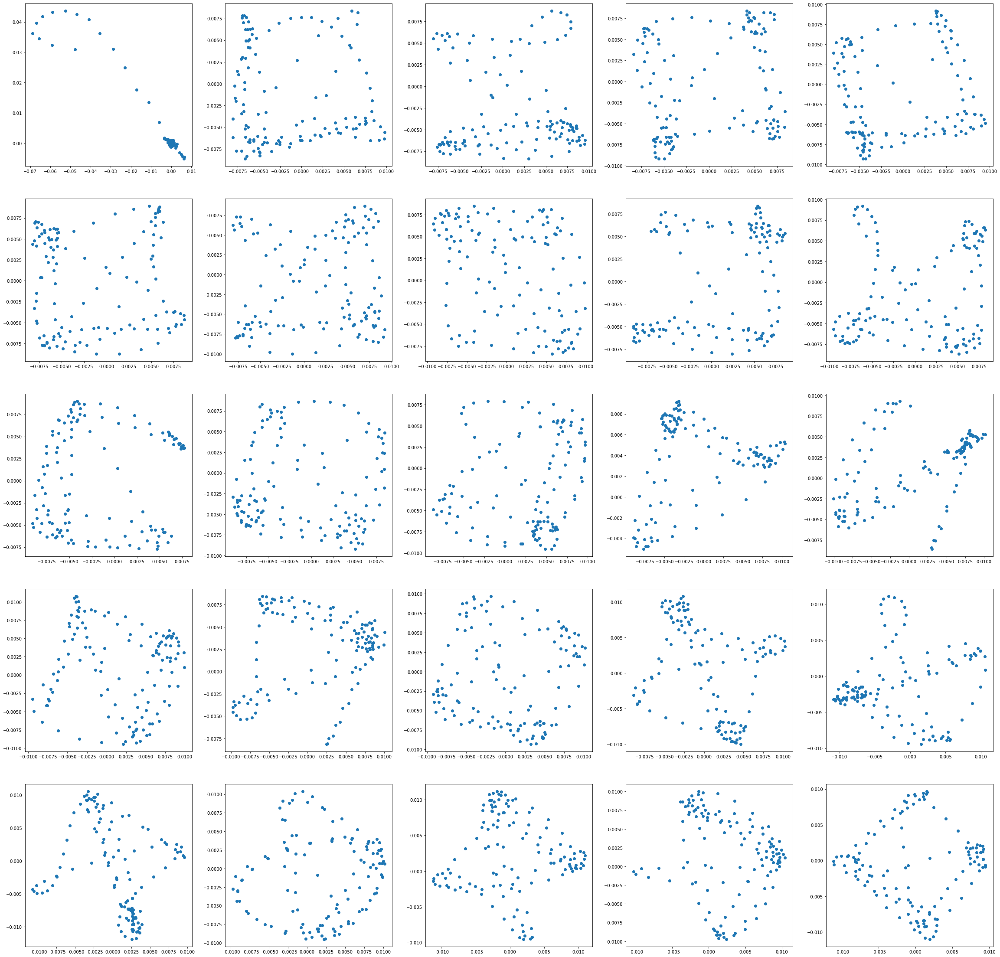

In [6]:
make_scatter("QPSK",18)

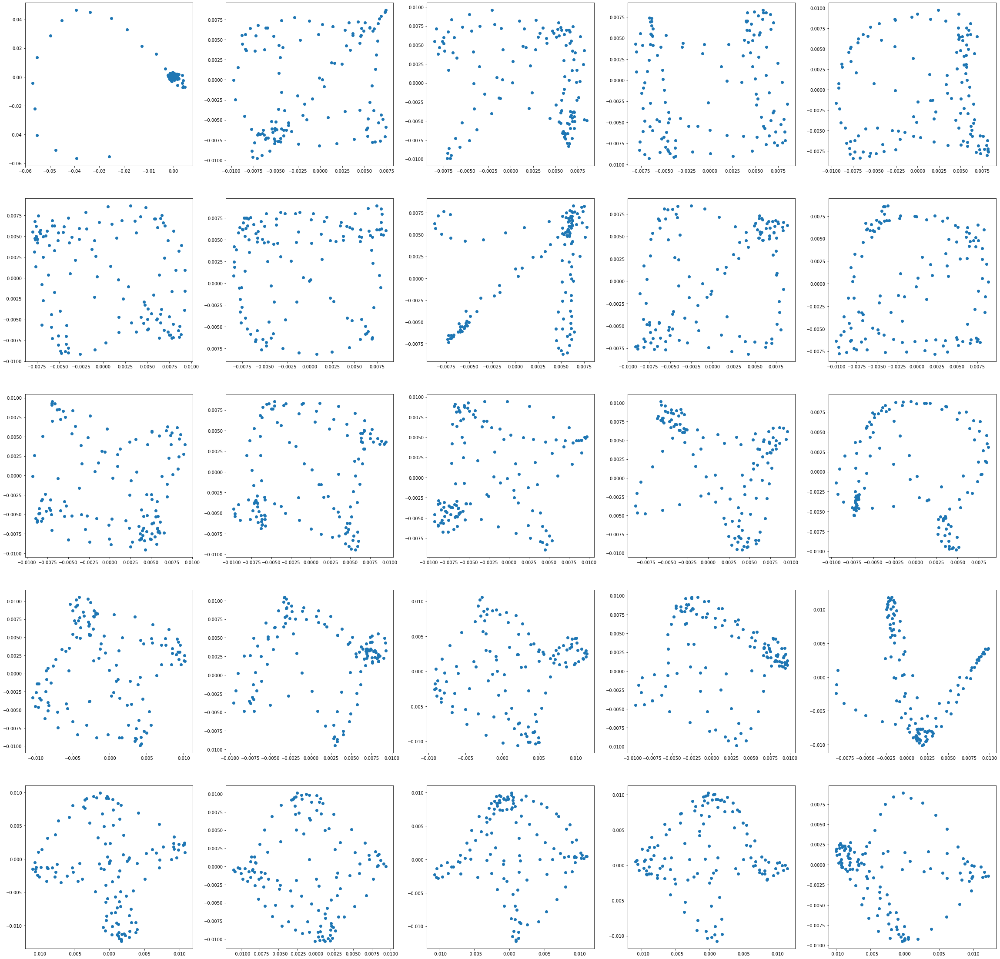

In [9]:
make_scatter("QPSK" , 14)

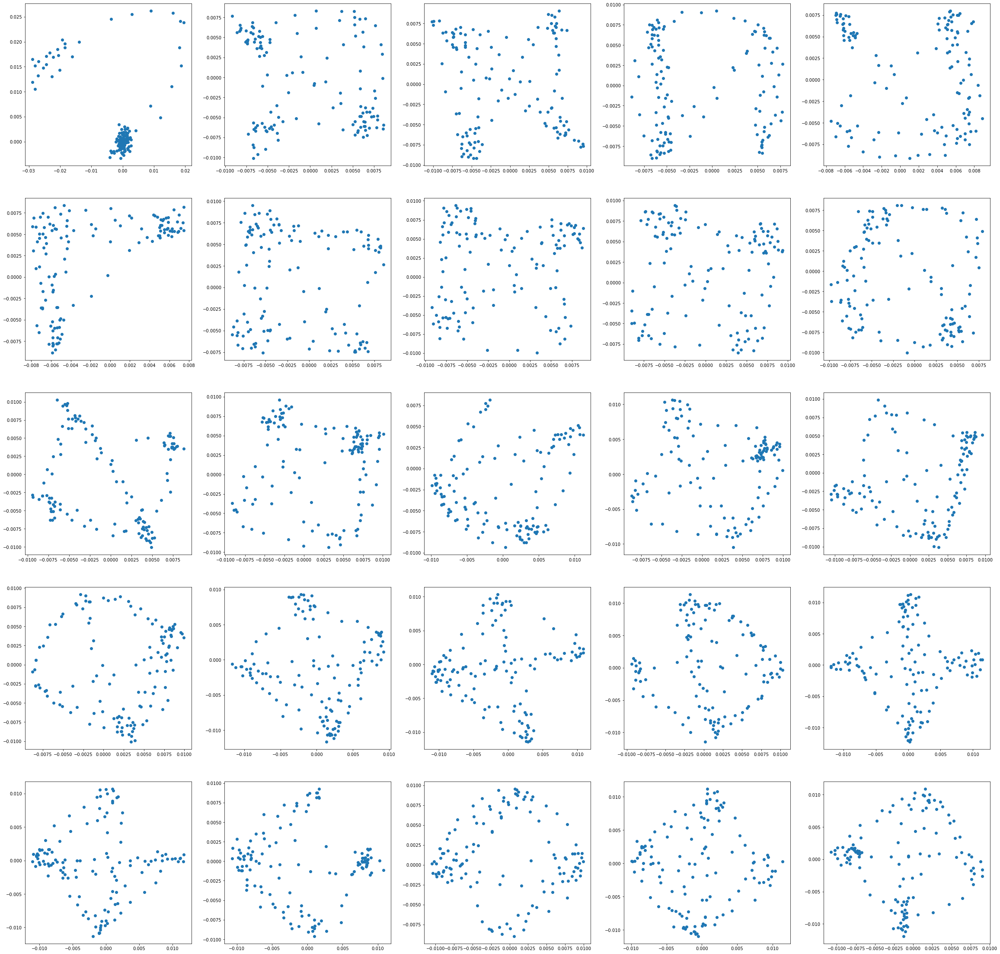

In [10]:
make_scatter("QPSK" , 10)

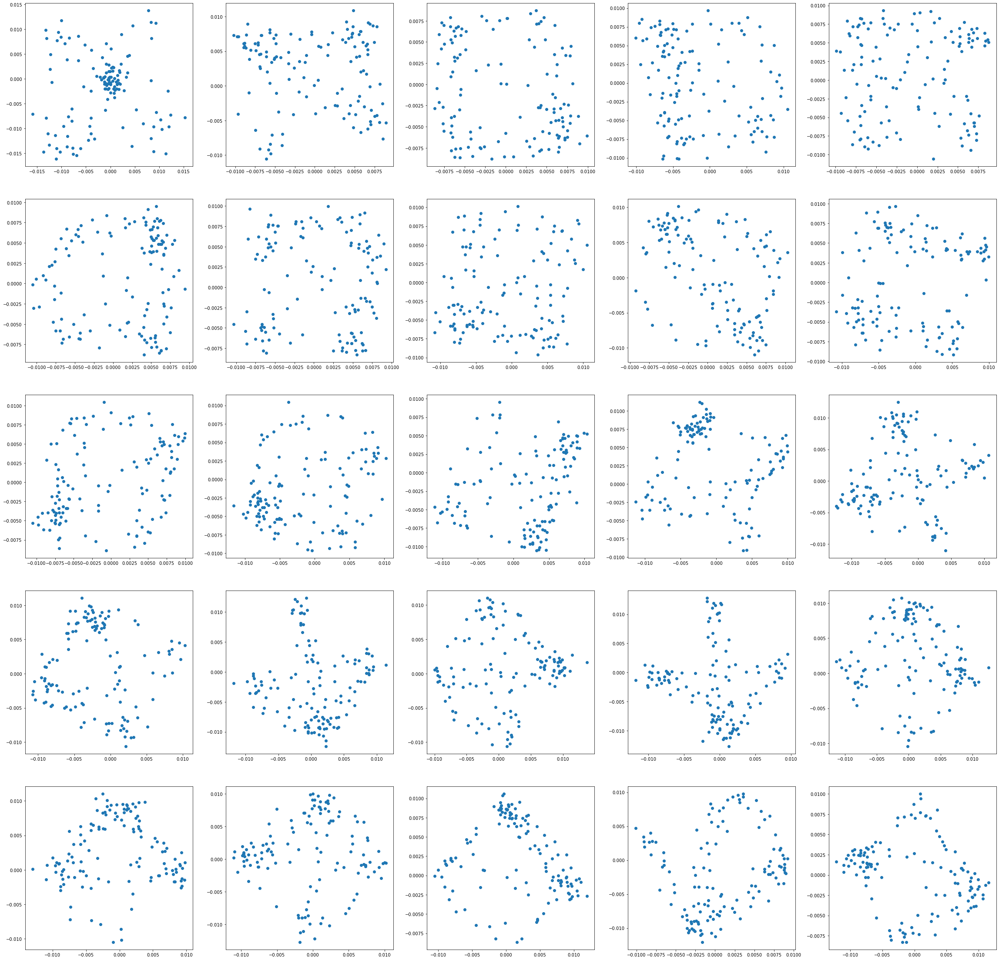

In [12]:
make_scatter("QPSK" , 6)

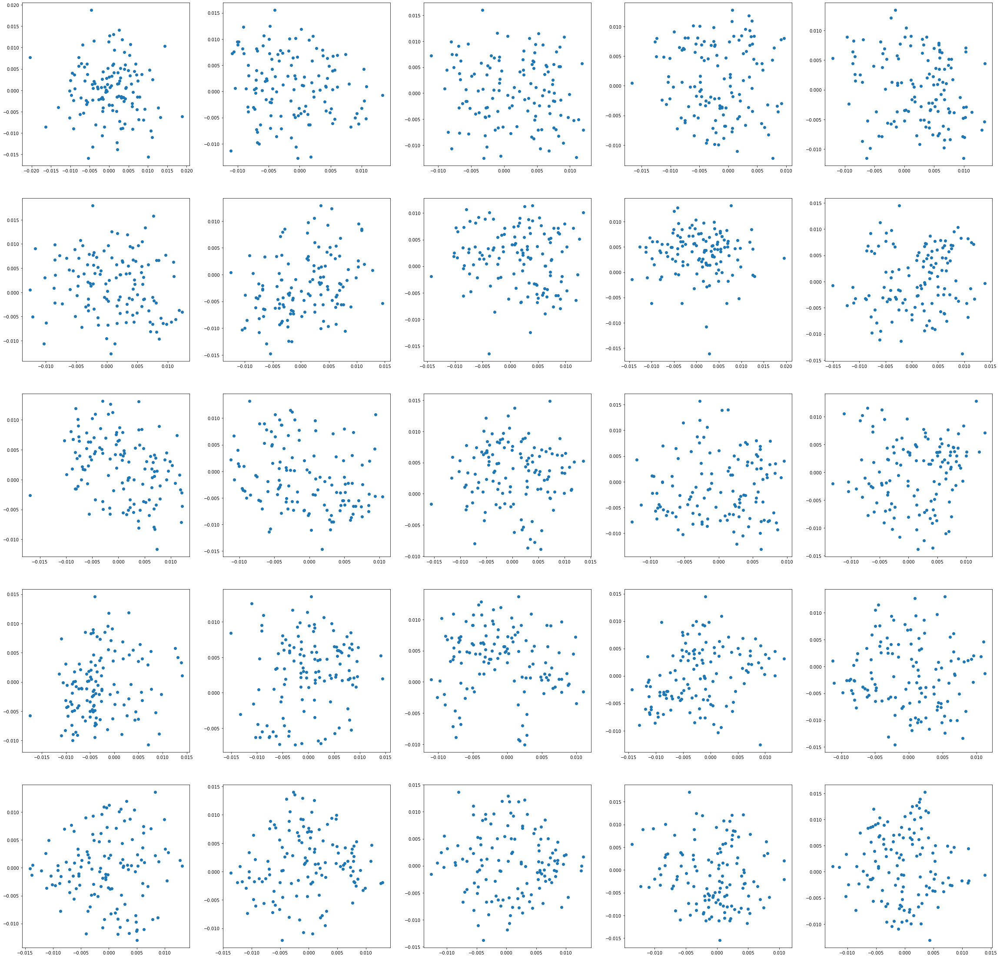

In [13]:
make_scatter("QPSK" , 0)

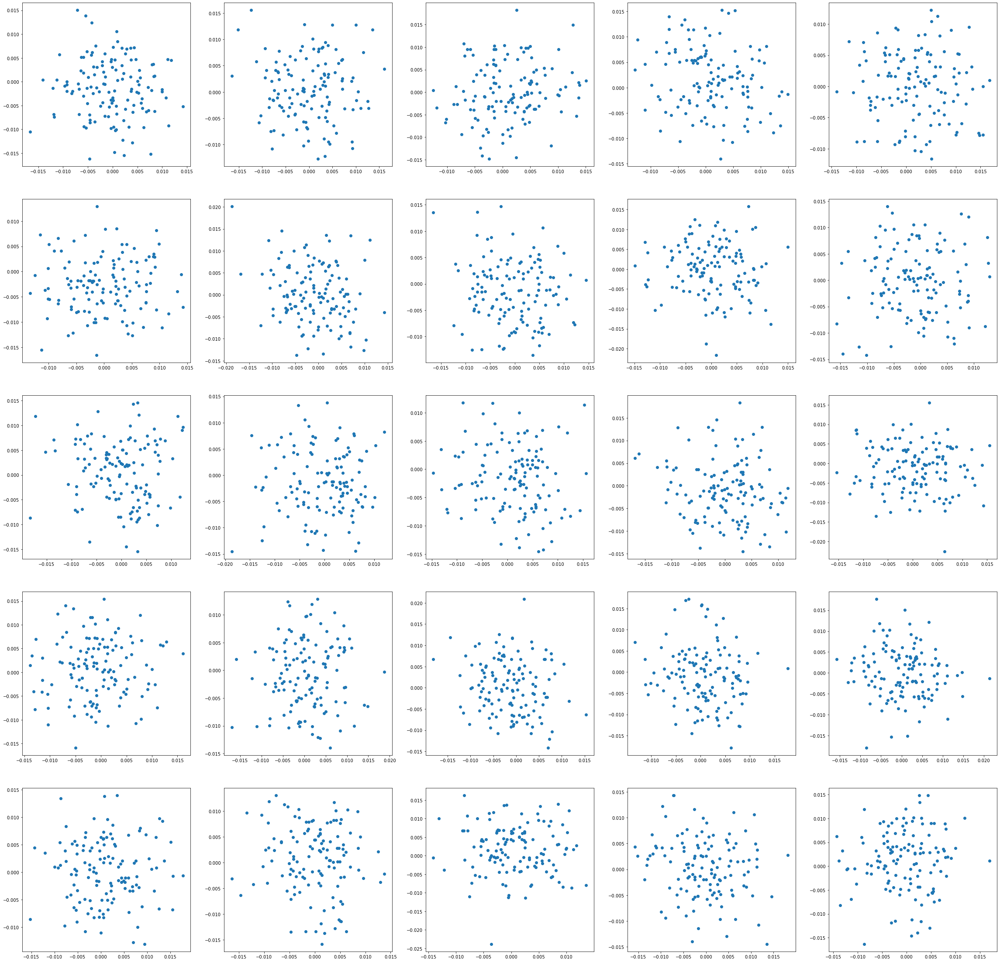

In [14]:
make_scatter("QPSK" , -4)

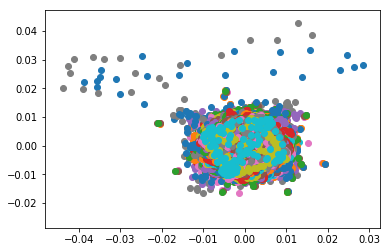

In [66]:
#plt.plot(Xd[('BPSK', 12)][25][0][:])
#plt.plot(Xd[('BPSK', 12)][25][1][:])
for i in range(int(X.shape[0]/len(snrs)/len(mods))):
     plt.scatter(Xd[('QPSK', 12)][i][0][:], Xd[('QPSK', 12)][i][1][:])

In [47]:
data2 = pd.DataFrame.from_dict(Xd)

ValueError: If using all scalar values, you must pass an index

In [36]:
label=[]
mod=[]
data=[]
for i in range(len(lbl)):
        label.append(lbl[i][0])
        mod.append(lbl[i][1])
        data.append(X[i])

In [37]:
data = pd.DataFrame([label,mod,data])


In [38]:
print(np.shape(data[0][2]))
data.head()

(2, 128)


,0,1,2,3,4,5,6,7,8,9,...,219990,219991,219992,219993,219994,219995,219996,219997,219998,219999
0,8PSK,8PSK,8PSK,8PSK,8PSK,8PSK,8PSK,8PSK,8PSK,8PSK,...,WBFM,WBFM,WBFM,WBFM,WBFM,WBFM,WBFM,WBFM,WBFM,WBFM
1,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,...,18,18,18,18,18,18,18,18,18,18
2,"[[0.0036192215, 0.00410537, 0.004187267, 0.002...","[[0.00119915, -0.0033767857, -0.0020501085, 0....","[[-0.011087893, 0.0005428866, -0.009227585, -0...","[[0.006570622, 0.013110517, -0.0056530396, 0.0...","[[-0.00090576196, -0.0047981697, -0.0040441593...","[[0.0021162932, 0.0053097256, -0.0018936634, -...","[[-0.004535497, 0.003943151, -0.0002959967, 0....","[[-0.011174369, 0.0012333274, 0.0023100567, 0....","[[0.0007560549, 0.004604575, -0.0064165494, -0...","[[-0.0035295845, -0.011332325, -0.0020342963, ...",...,"[[-0.0033151638, -0.003266336, -0.0032388037, ...","[[-0.0037992827, -0.003982059, -0.003778102, -...","[[-0.004136059, -0.004169779, -0.0041638194, -...","[[-0.0042399284, -0.0042335168, -0.004208437, ...","[[-0.0041046212, -0.004155369, -0.0042298804, ...","[[-0.004128783, -0.0041704816, -0.004077609, -...","[[-0.005453543, -0.005291223, -0.0054416186, -...","[[-0.0056944876, -0.0057479283, -0.005633306, ...","[[-0.006774092, -0.0066120196, -0.0067578144, ...","[[-0.0068657007, -0.00682352, -0.00681633, -0...."


In [44]:
data.loc[[0]] == "8PSK"

,0,1,2,3,4,5,6,7,8,9,...,219990,219991,219992,219993,219994,219995,219996,219997,219998,219999
0,True,True,True,True,True,True,True,True,True,True,...,False,False,False,False,False,False,False,False,False,False
